<a href="https://colab.research.google.com/github/mohamedtal/PFE2021/blob/main/Display_Images_From_Diffrent_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time as t
import cv2
import warnings
import shutil
import os
#import keras
from keras.utils import to_categorical
from keras.models import Sequential
from keras import regularizers
from keras.layers import Dense, Dropout
from matplotlib import pyplot


# Sklearn utils.
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.utils import shuffle

# Keras.
from keras.applications.resnet50 import ResNet50
from keras.applications import DenseNet121
from keras.utils import Sequence
from keras.layers import Dense, Dropout, Flatten, Input, ZeroPadding2D, GlobalAveragePooling2D
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers.normalization import BatchNormalization
from keras import regularizers
from keras.models import Model
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from keras import optimizers
from keras.utils import to_categorical
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K
import tensorflow as tf

# to generate data augmentation a partir de aptos 2019 preprocessed
import imageio
import imgaug as ia
import imgaug.augmenters as iaa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib
import os
import cv2
%matplotlib inline

In [1]:
# before all don't forget to use the GPU

# at first we need to get the dataset from the drive 
# pfe2021.1@gmail.com		zakimoha123
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
# for the test
!unzip /content/drive/MyDrive/dataset/DR-2019-test.zip

In [3]:
#unzip the dataset

# for the train
!unzip /content/drive/MyDrive/dataset/DR-dataset2015.zip

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: DR-dataset/train/2/3213_right.jpg  
  inflating: DR-dataset/train/2/15711_left.jpg  
  inflating: DR-dataset/train/2/43042_left.jpg  
  inflating: DR-dataset/train/2/13786_right.jpg  
  inflating: DR-dataset/train/2/40319_left.jpg  
  inflating: DR-dataset/train/2/13667_left.jpg  
  inflating: DR-dataset/train/2/3778_right.jpg  
  inflating: DR-dataset/train/2/44263_right.jpg  
  inflating: DR-dataset/train/2/10438_right.jpg  
  inflating: DR-dataset/train/2/25458_right.jpg  
  inflating: DR-dataset/train/2/40201_left.jpg  
  inflating: DR-dataset/train/2/32668_left.jpg  
  inflating: DR-dataset/train/2/19202_left.jpg  
  inflating: DR-dataset/train/2/22461_left.jpg  
  inflating: DR-dataset/train/2/40676_left.jpg  
  inflating: DR-dataset/train/2/41335_right.jpg  
  inflating: DR-dataset/train/2/10468_left.jpg  
  inflating: DR-dataset/train/2/2705_left.jpg  
  inflating: DR-dataset/train/2/3399

# images from dataset EyePacs2015

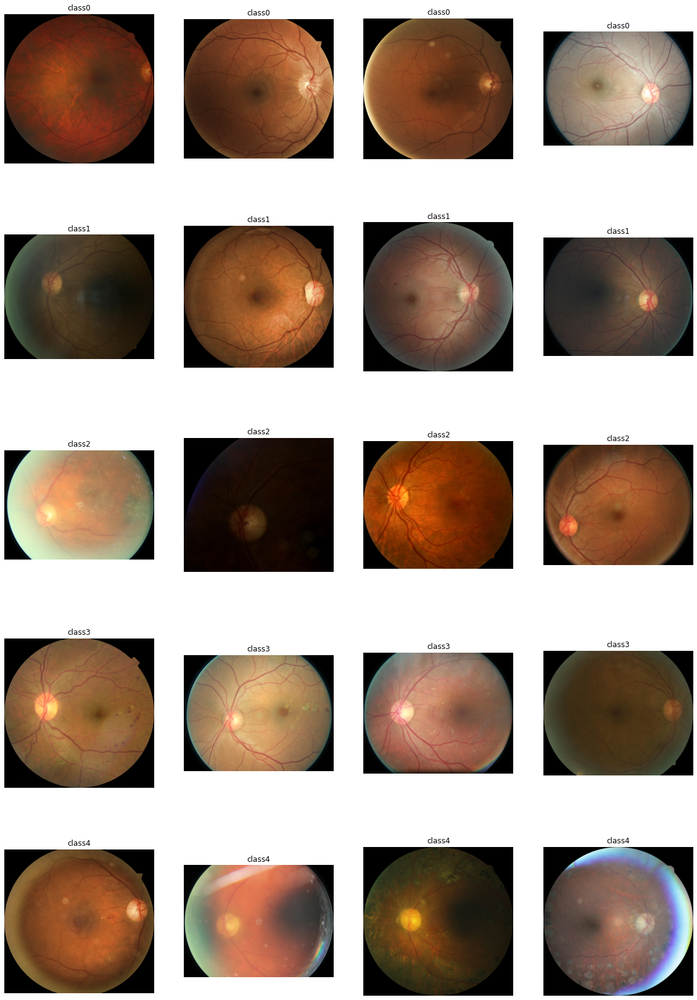

In [12]:
import os
import random
import cv2


fig = plt.figure(figsize=(20, 30)) 
  
# setting values to rows and column variables 
rows = 5
columns = 4

i = 1
path = 'DR-dataset/train/'
for c in range(5):
  list_images = os.listdir(path+str(c))
  choosed_images = random.sample(list_images,4)
  for image in choosed_images:
    new_path = path+str(c)+'/'+image
    img = cv2.imread(new_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Adds a subplot at the 1st position
    fig.add_subplot(rows, columns, i)  
    # showing image 
    plt.imshow(img) 
    plt.axis('off') 
    plt.title("class"+str(c)) 
    i = i +1


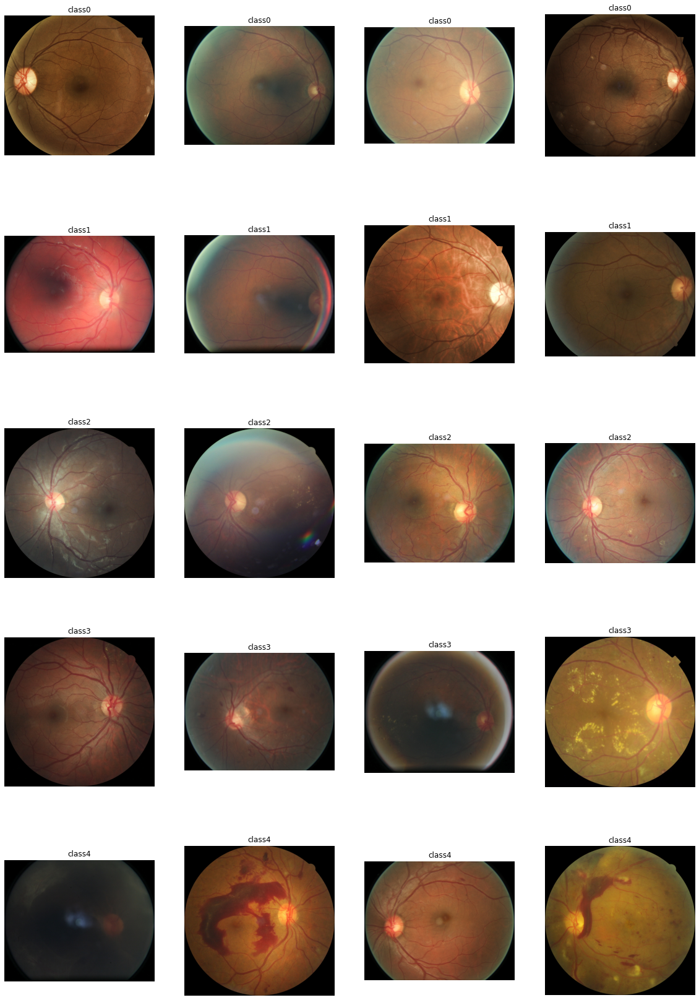

In [13]:
import os
import random
import cv2


fig = plt.figure(figsize=(20, 30)) 
  
# setting values to rows and column variables 
rows = 5
columns = 4

i = 1
path = 'DR-dataset/train/'
for c in range(5):
  list_images = os.listdir(path+str(c))
  choosed_images = random.sample(list_images,4)
  for image in choosed_images:
    new_path = path+str(c)+'/'+image
    img = cv2.imread(new_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Adds a subplot at the 1st position
    fig.add_subplot(rows, columns, i)  
    # showing image 
    plt.imshow(img) 
    plt.axis('off') 
    plt.title("class"+str(c)) 
    i = i +1

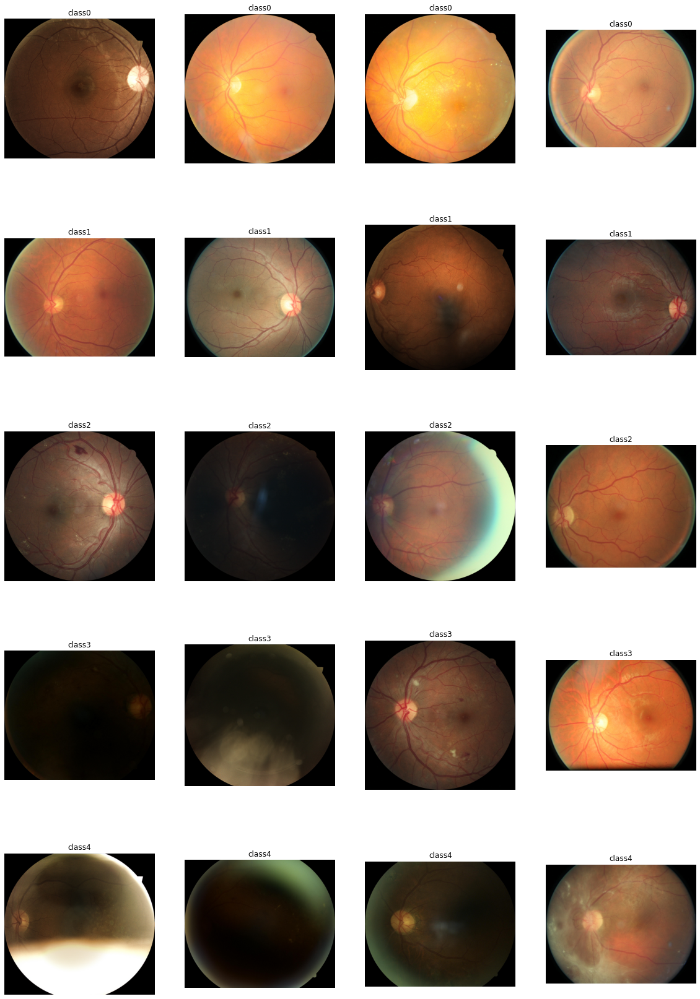

In [16]:
import os
import random
import cv2


fig = plt.figure(figsize=(20, 30)) 
  
# setting values to rows and column variables 
rows = 5
columns = 4

i = 1
path = 'DR-dataset/train/'
for c in range(5):
  list_images = os.listdir(path+str(c))
  choosed_images = random.sample(list_images,4)
  for image in choosed_images:
    new_path = path+str(c)+'/'+image
    img = cv2.imread(new_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Adds a subplot at the 1st position
    fig.add_subplot(rows, columns, i)  
    # showing image 
    plt.imshow(img) 
    plt.axis('off') 
    plt.title("class"+str(c)) 
    i = i +1

# APTOS 2019 dataset

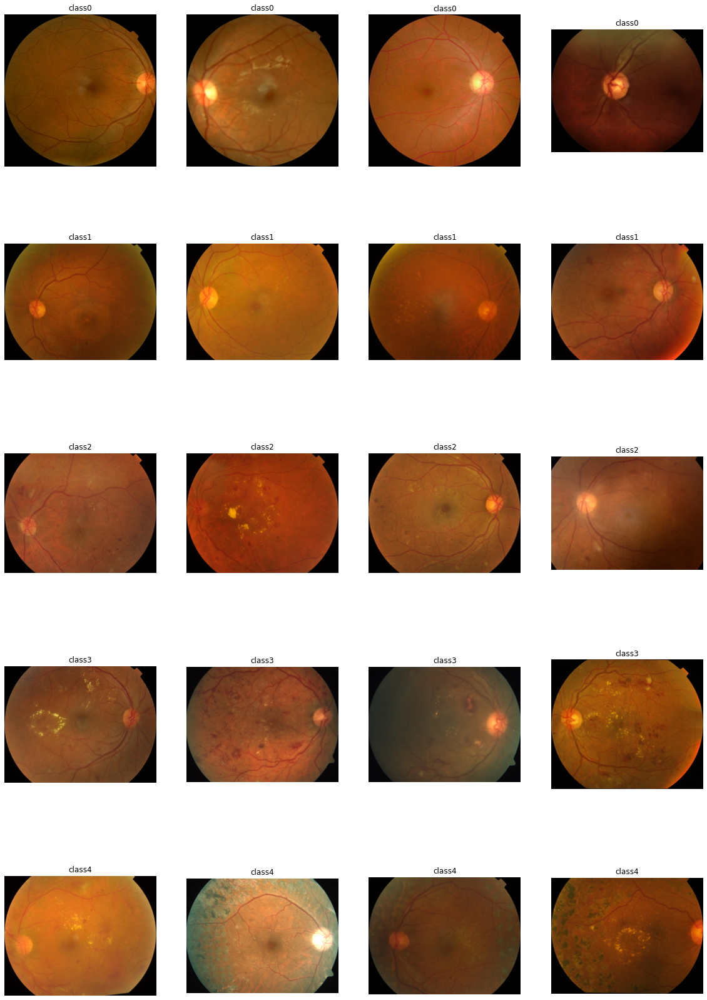

In [17]:
import os
import random
import cv2


fig = plt.figure(figsize=(20, 30)) 
  
# setting values to rows and column variables 
rows = 5
columns = 4

i = 1
path = 'DR-dataset2019-test/test/'
for c in range(5):
  list_images = os.listdir(path+str(c))
  choosed_images = random.sample(list_images,4)
  for image in choosed_images:
    new_path = path+str(c)+'/'+image
    img = cv2.imread(new_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Adds a subplot at the 1st position
    fig.add_subplot(rows, columns, i)  
    # showing image 
    plt.imshow(img) 
    plt.axis('off') 
    plt.title("class"+str(c)) 
    i = i +1

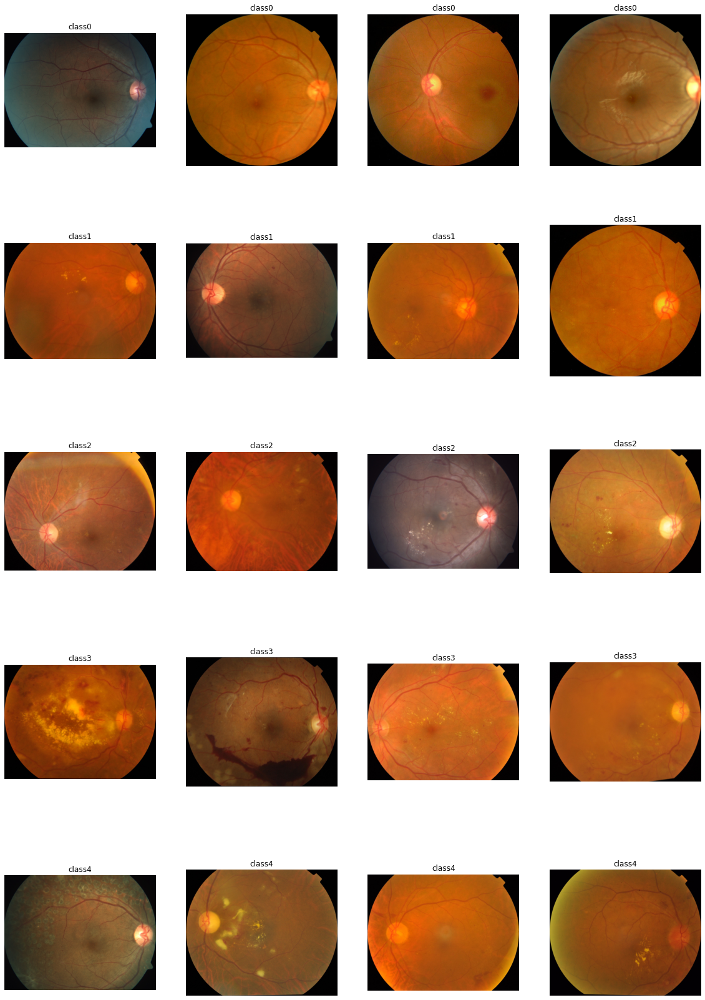

In [18]:
import os
import random
import cv2


fig = plt.figure(figsize=(20, 30)) 
  
# setting values to rows and column variables 
rows = 5
columns = 4

i = 1
path = 'DR-dataset2019-test/test/'
for c in range(5):
  list_images = os.listdir(path+str(c))
  choosed_images = random.sample(list_images,4)
  for image in choosed_images:
    new_path = path+str(c)+'/'+image
    img = cv2.imread(new_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Adds a subplot at the 1st position
    fig.add_subplot(rows, columns, i)  
    # showing image 
    plt.imshow(img) 
    plt.axis('off') 
    plt.title("class"+str(c)) 
    i = i +1

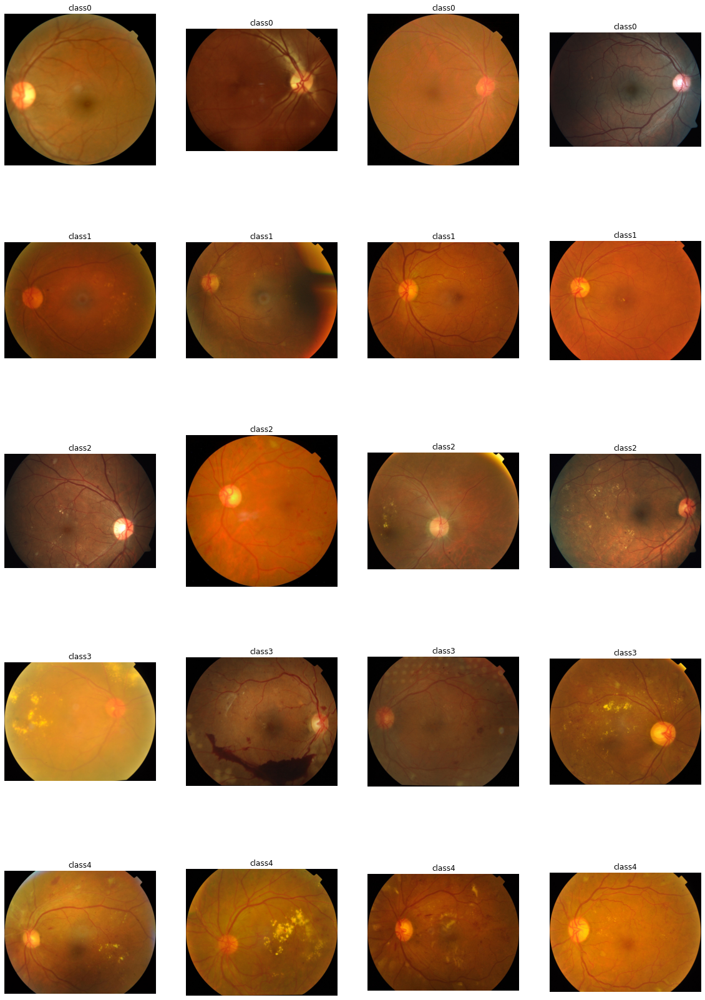

In [21]:
import os
import random
import cv2


fig = plt.figure(figsize=(20, 30)) 
  
# setting values to rows and column variables 
rows = 5
columns = 4

i = 1
path = 'DR-dataset2019-test/test/'
for c in range(5):
  list_images = os.listdir(path+str(c))
  choosed_images = random.sample(list_images,4)
  for image in choosed_images:
    new_path = path+str(c)+'/'+image
    img = cv2.imread(new_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Adds a subplot at the 1st position
    fig.add_subplot(rows, columns, i)  
    # showing image 
    plt.imshow(img) 
    plt.axis('off') 
    plt.title("class"+str(c)) 
    i = i +1